In [3]:
pip install osmnx


[notice] A new release of pip available: 22.3.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install ortools


[notice] A new release of pip available: 22.3.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import osmnx as ox
import networkx as nx
from ortools.constraint_solver import pywrapcp
from ortools.constraint_solver import routing_enums_pb2
import plotly.express as px

In [5]:
city = "Hong Kong"

dtf = pd.read_csv('data_stores.csv')
dtf = dtf[dtf["City"]==city][
        ["City","Street Address","Latitude","Longitude"]
      ].reset_index(drop=True)
dtf = dtf.reset_index().rename(
      columns={"index":"id", "Latitude":"y", "Longitude":"x"})

print("tot:", len(dtf))
dtf.head(3)

tot: 104


,id,City,Street Address,y,x
0,0,Hong Kong,"Shop No.101, 1st Floor, Liberte Place, 8, 33 L...",22.33,114.15
1,1,Hong Kong,"Shop B, Ground Floor, 50 Connaught Central, Ce...",22.29,114.16
2,2,Hong Kong,"Office Lobby, G/F Exchange Square, Central",22.28,114.16


In [6]:
i = 0
dtf["base"] = dtf["id"].apply(lambda x: 1 if x==i else 0)
start = dtf[dtf["base"]==1][["y","x"]].values[0]

print("start =", start)
dtf.head(3)

start = [ 22.33 114.15]


,id,City,Street Address,y,x,base
0,0,Hong Kong,"Shop No.101, 1st Floor, Liberte Place, 8, 33 L...",22.33,114.15,1
1,1,Hong Kong,"Shop B, Ground Floor, 50 Connaught Central, Ce...",22.29,114.16,0
2,2,Hong Kong,"Office Lobby, G/F Exchange Square, Central",22.28,114.16,0


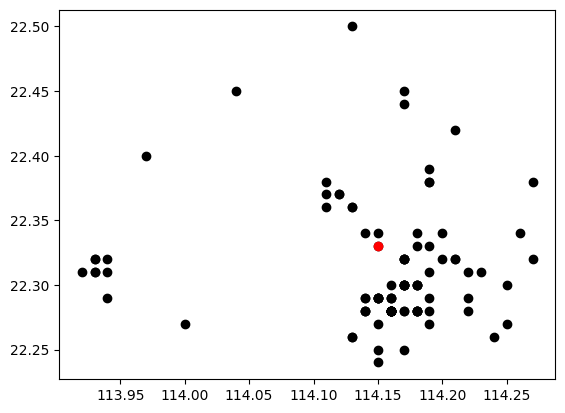

In [7]:
plt.scatter(y=dtf["y"],x=dtf["x"],color="black")
plt.scatter(y=start[0],x=start[1],color="red")
plt.show()

In [8]:
data = dtf.copy()
color = "base"
lst_color = ["black","red"]
popup = "id"

In [9]:
map_ = folium.Map(location=start, tiles="cartodbpositron", zoom_start=11)

In [10]:
lst_elements = sorted(list(data[color].unique()))
data["color"] = data[color].apply(lambda x: lst_color[lst_elements.index(x)])

In [11]:
data.apply(lambda row:
    folium.CircleMarker(
            location=[row["y"],row["x"]], popup=row[popup],
            color=row["color"], fill=True, radius=5).add_to(map_),
    axis=1)
plugins.Fullscreen(position="topright", title="Expand",
      title_cancel="Exit", force_separate_button=True).add_to(map_)
map_

In [12]:
for i in range(len(dtf)):
  points = [start, dtf[["y","x"]].iloc[i].tolist()]
  folium.PolyLine(points, tooltip="Coast", color="red",weight=0.5,opacity=0.5).add_to(map_)

map_

In [13]:
layers = ["cartodbpositron", "openstreetmap", "Stamen Terrain",
          "Stamen Water Color", "Stamen Toner", "cartodbdark_matter"]
for tile in layers:
    folium.TileLayer(tile).add_to(map_)
folium.LayerControl(position='bottomright').add_to(map_)
map_

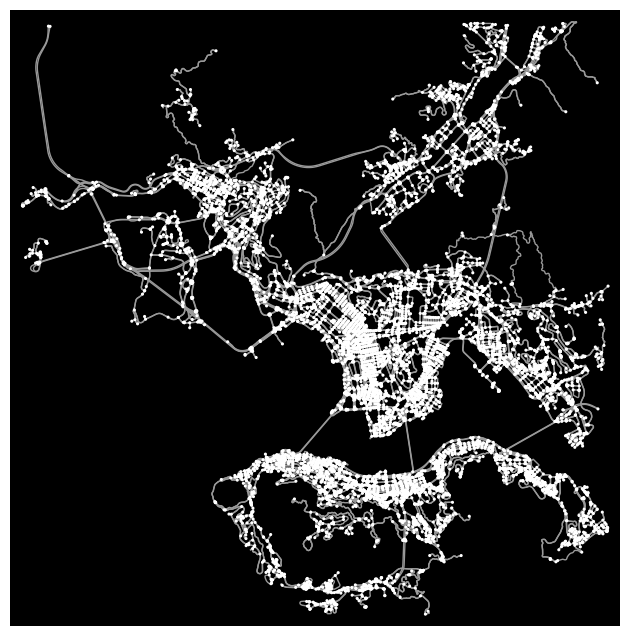

In [14]:
G = ox.graph_from_point(start, dist=10000,network_type="drive")
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)
fig, ax = ox.plot_graph(G, bgcolor="black", node_size=5,
        node_color="white", figsize=(16,8))

In [15]:
# geo-dataframe (nodes)
print("nodes:", len(G.nodes()))
ox.graph_to_gdfs(G, nodes=True, edges=False).reset_index().head(3)

nodes: 9587


,osmid,y,x,street_count,ref,highway,geometry
0,24533064,22.276527,114.173172,3,NaN,NaN,POINT (114.17317 22.27653)
1,26411640,22.250336,114.169964,3,NaN,NaN,POINT (114.16996 22.25034)
2,26411641,22.250535,114.170864,3,NaN,NaN,POINT (114.17086 22.25053)


In [16]:
print("links:", len(G.edges()))
ox.graph_to_gdfs(G, nodes=False, edges=True).reset_index().head(3)

links: 17520


,u,v,key,osmid,oneway,lanes,name,highway,reversed,length,...,geometry,ref,maxspeed,junction,bridge,area,access,tunnel,width,service
0,24533064,1618530627,0,743072632,True,2,莊士敦道 Johnston Road,tertiary,False,38.526,...,"LINESTRING (114.17317 22.27653, 114.17280 22.2...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,24533064,297187423,0,567856161,False,2,莊士敦道 Johnston Road,tertiary,False,30.191,...,"LINESTRING (114.17317 22.27653, 114.17332 22.2...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,26411640,26411641,0,"[1198101498, 1198101500, 46766846]",True,3,黃竹坑道 Wong Chuk Hang Road,trunk,False,95.355,...,"LINESTRING (114.16996 22.25034, 114.17004 22.2...",1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
end = dtf[dtf["id"]==68][["y","x"]].values[0]
print("locations: from", start, "--> to", end)

locations: from [ 22.33 114.15] --> to [ 22.34 114.15]


In [18]:
start_node = ox.distance.nearest_nodes(G, start[1], start[0])
end_node = ox.distance.nearest_nodes(G, end[1], end[0])
print("nodes: from", start_node, "--> to", end_node)

nodes: from 493883072 --> to 480679404


In [19]:
path_lenght = nx.shortest_path(G, source=start_node, target=end_node, method="dijkstra", weight='lenght')
print(path_lenght)

[493883072, 289293755, 289294146, 289294087, 275816026, 289329905, 1182677821, 1645492788, 1645492916, 1191992694, 5101419365, 332257610, 999331442, 1191992696, 480679312, 999331647, 1641766800, 480679404]


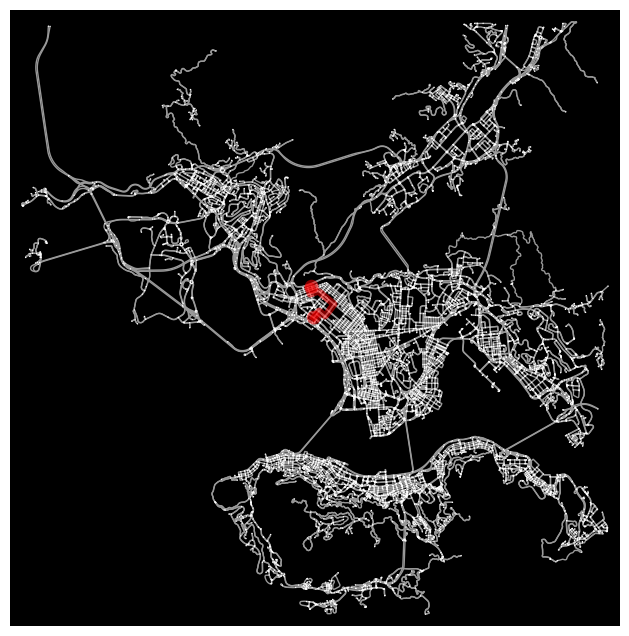

In [20]:
fig, ax = ox.plot_graph_route(G, path_lenght, route_color="red",
                              route_linewidth=5, node_size=1,
                              bgcolor='black', node_color="white",
                              figsize=(16,8))

[493883072, 289293755, 289294146, 289295423, 289295628, 289295766, 289295767, 289295566, 5101376323, 4844635141, 289295620, 274244744, 1641766635, 1641766639, 1641766654, 999331442, 1191992696, 480679312, 999331647, 1641766800, 480679404]


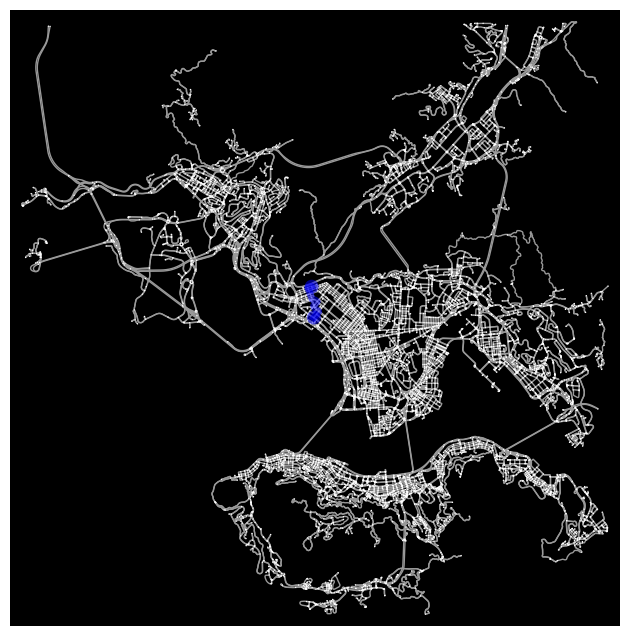

In [21]:
path_time = nx.shortest_path(G, source=start_node, target=end_node,
                              method='dijkstra', weight='travel_time')
print(path_time)

fig, ax = ox.plot_graph_route(G, path_time, route_color="blue",
                              route_linewidth=5, node_size=1,
                              bgcolor='black', node_color="white",
                              figsize=(16,8))

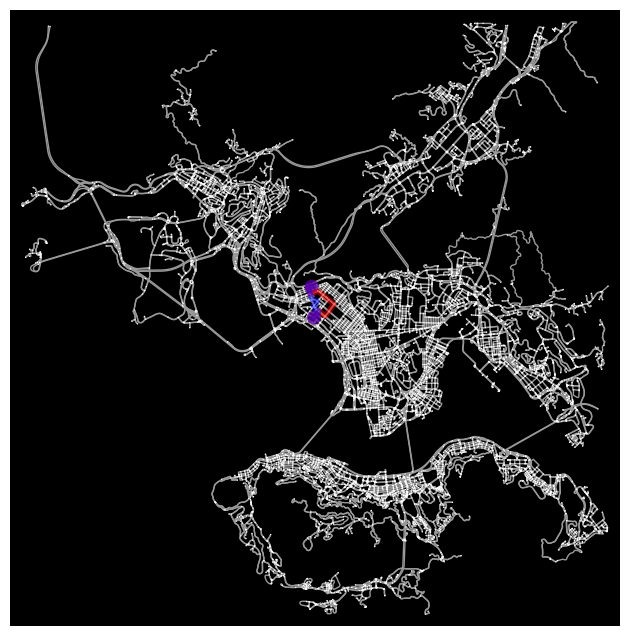

In [22]:
fig, ax = ox.plot_graph_routes(G, routes=[path_lenght, path_time],
                              route_colors=["red","blue"],
                              route_linewidth=5, node_size=1,
                              bgcolor='black', node_color="white",
                              figsize=(16,8))

In [23]:
ox.plot_route_folium(G, route=path_lenght, route_map=map_,
                     color="red", weight=1)
ox.plot_route_folium(G, route=path_time, route_map=map_,
                     color="blue", weight=1)
map_

<ipython-input-23-87ecfde5386a>:1: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path_lenght, route_map=map_,
<ipython-input-23-87ecfde5386a>:3: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path_time, route_map=map_,


In [24]:
lst_start, lst_end = [],[]
start_x, start_y = [],[]
end_x, end_y = [],[]
lst_length, lst_time = [],[]

In [25]:
for a,b in zip(path_time[:-1],path_time[1:]):
  lst_start.append(a)
  lst_end.append(b)
  lst_length.append(round(G.edges[(a,b,0)]['length']))
  lst_time.append(round(G.edges[(a,b,0)]['travel_time']))
  start_x.append(G.nodes[a]['x'])
  start_y.append(G.nodes[a]['y'])
  end_x.append(G.nodes[b]['x'])
  end_y.append(G.nodes[b]['y'])


In [26]:
df = pd.DataFrame(list(zip(lst_start, lst_end,
                           start_x, start_y, end_x, end_y,
                           lst_length, lst_time)),
                   columns=["start","end","start_x","start_y",
                            "end_x","end_y","length","travel_time"]
                  ).reset_index().rename(columns={"index":"id"})

In [27]:
df.head()

,id,start,end,start_x,start_y,end_x,end_y,length,travel_time
0,0,493883072,289293755,114.150598,22.330550,114.151500,22.331566,146,12
1,1,289293755,289294146,114.151500,22.331566,114.152190,22.332349,112,10
2,2,289294146,289295423,114.152190,22.332349,114.151381,22.332983,109,8
3,3,289295423,289295628,114.151381,22.332983,114.150783,22.333581,91,6
4,4,289295628,289295766,114.150783,22.333581,114.150609,22.333969,47,3


In [28]:
df_start = df[df["start"]==start_node]
df_end = df[df["end"]==end_node]
fig = px.scatter_mapbox(data_frame=df, lon="start_x", lat="start_y",
                        zoom=15, width=1000, height=800,
                        animation_frame="id",
                        mapbox_style="carto-positron")

In [29]:
fig.data[0].marker = {"size":12}
fig.add_trace(px.scatter_mapbox(data_frame=df_start,
                                lon="start_x", lat="start_y").data[0])
fig.data[1].marker = {"size":15, "color":"red"}
fig.add_trace(px.scatter_mapbox(data_frame=df_end,
                                lon="start_x", lat="start_y").data[0])
fig.data[2].marker = {"size":15, "color":"green"}
fig.add_trace(px.line_mapbox(data_frame=df,
                             lon="start_x", lat="start_y").data[0])
fig

In [30]:
dtf["node"] = dtf[["y","x"]].apply(lambda x:
                           ox.distance.nearest_nodes(G, x[1], x[0]),
                        axis=1)
dtf = dtf.drop_duplicates("node", keep='first')
dtf.head()

,id,City,Street Address,y,x,base,node
0,0,Hong Kong,"Shop No.101, 1st Floor, Liberte Place, 8, 33 L...",22.33,114.15,1,493883072
1,1,Hong Kong,"Shop B, Ground Floor, 50 Connaught Central, Ce...",22.29,114.16,0,4615742665
2,2,Hong Kong,"Office Lobby, G/F Exchange Square, Central",22.28,114.16,0,8207129414
3,3,Hong Kong,"Shop 247, Level 2, Moko 193 Prince Edward Rd W...",22.32,114.17,0,308473193
4,4,Hong Kong,"Shop NO. 106 1/F, East Point City, No. 8, Chun...",22.32,114.27,0,919340746


In [31]:
def f(a,b):
  try:
    d = nx.shortest_path_length(G, source=a, target=b, method='dijkstra', weight='travel_time')
  except:
    d = np.nan
  return d


In [32]:
distance_matrix = np.asarray([[f(a,b) for b in dtf["node"].tolist()] for a in dtf["node"].tolist()])
distance_matrix = pd.DataFrame(distance_matrix, columns=dtf["node"].values, index=dtf["node"].values)
distance_matrix.head()

,493883072,4615742665,8207129414,308473193,919340746,1002550791,316735801,1271129005,5103531349,2280300926,...,26411640,345538787,4850194903,4775210721,1653118849,7235049604,474728810,10199917434,1623825285,1685958990
493883072,0.0,462.5,541.2,173.9,NaN,582.1,1019.3,314.5,401.6,262.0,...,794.8,771.3,564.9,315.5,837.4,736.8,452.9,694.3,679.5,828.0
4615742665,530.9,0.0,111.2,510.6,NaN,205.3,676.7,704.4,479.4,548.6,...,466.2,571.8,276.9,608.8,494.8,394.2,707.4,494.8,361.2,462.0
8207129414,530.7,95.1,0.0,512.6,NaN,203.8,706.3,704.2,481.4,550.6,...,445.9,570.2,278.5,610.8,524.4,423.8,709.4,493.2,349.6,440.8
308473193,193.8,424.0,491.1,0.0,NaN,430.4,867.6,451.2,228.1,145.9,...,643.1,732.8,413.2,206.1,685.7,585.1,304.1,655.8,527.8,789.5
919340746,815.1,831.9,809.7,680.3,0.0,706.3,769.6,1008.4,583.9,599.7,...,978.9,1104.8,714.0,584.2,587.7,487.1,434.9,1200.5,819.3,1160.5


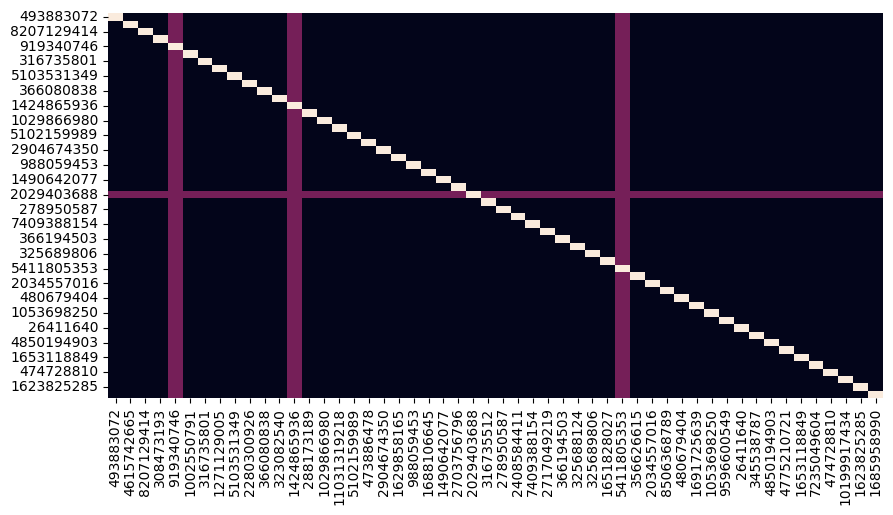

In [33]:
heatmap = distance_matrix.copy()
for col in heatmap.columns:
    heatmap[col] = heatmap[col].apply(lambda x:
                       0.3 if pd.isnull(x) else  #nan -> purple
                      (0.7 if np.isinf(x) else   #inf -> orange
                      (0 if x!=0 else 1) ))      # 0  -> white

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(heatmap, vmin=0, vmax=1, cbar=False, ax=ax)
plt.show()

In [34]:
distance_matrix = distance_matrix.T.fillna(distance_matrix.mean(axis=1)).T


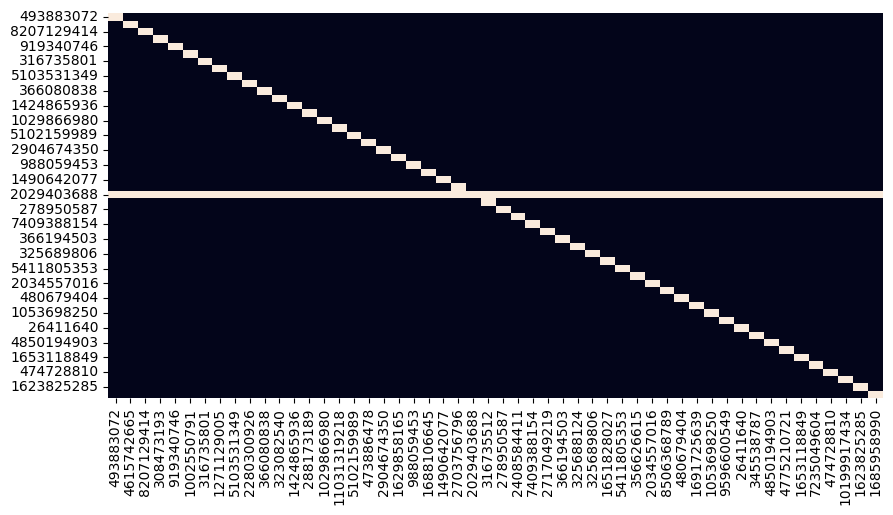

In [35]:
heatmap = distance_matrix.copy()
for col in heatmap.columns:
    heatmap[col] = heatmap[col].apply(lambda x: 0.3 if pd.isnull(x) else  #nan -> purple
                                               (0.7 if np.isinf(x) else   #inf -> orange
                                               (0 if x!=0 else 1) ))      # 0  -> white

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(heatmap, vmin=0, vmax=1, cbar=False, ax=ax)
plt.show()

In [36]:
drivers = 1
lst_nodes = dtf["node"].tolist()
print("start:", start_node, "| tot locations to visit:",
     len(lst_nodes)-1, "| drivers:", drivers)

start: 493883072 | tot locations to visit: 51 | drivers: 1


In [37]:
manager = pywrapcp.RoutingIndexManager(len(lst_nodes),drivers,lst_nodes.index(start_node))
model = pywrapcp.RoutingModel(manager)

In [38]:
def get_distance(from_index, to_index):
  return distance_matrix.iloc[from_index,to_index]

distance = model.RegisterPositiveTransitCallback(get_distance)
model.SetArcCostEvaluatorOfAllVehicles(distance)

AttributeError: ignored

In [39]:
parameters = pywrapcp.DefaultRoutingSearchParameters()
parameters.first_solution_strategy = (
          routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC
)

In [40]:
solution = model.SolveWithParameters(parameters)

index = model.Start(0)
print('Route for Driver:')
route_idx, route_distance = [], 0
while not model.IsEnd(index):
  route_idx.append(manager.IndexToNode(index))
  previous_index = index
  index = solution.Value(model.NextVar(index))
  try:
    route_distance += get_distance(previous_index, index)
  except:
    route_distance += model.GetArcCostForVehicle(from_index=previous_index, to_index=index, vehicle=0)

print(route_idx)
print(f'Total distance: {round(route_distance/1000,2)} km')
print(f'Nodes visited: {len(route_idx)}')

Route for Driver:
[0, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Total distance: 37.13 km
Nodes visited: 52


In [41]:
print("Route for driver (nodes):")
lst_route = [lst_nodes[i] for i in route_idx]
print(lst_route)

Route for driver (nodes):
[493883072, 1685958990, 1623825285, 10199917434, 474728810, 7235049604, 1653118849, 4775210721, 4850194903, 345538787, 26411640, 9596600549, 1053698250, 1691725639, 480679404, 8506368789, 2034557016, 356626615, 5411805353, 1651828027, 325689806, 325688124, 366194503, 2717049219, 7409388154, 2408584411, 278950587, 316735512, 2029403688, 2703756796, 1490642077, 1688106645, 988059453, 1629858165, 2904674350, 473886478, 5102159989, 11031319218, 1029866980, 288173189, 1424865936, 323082540, 366080838, 2280300926, 5103531349, 1271129005, 316735801, 1002550791, 919340746, 308473193, 8207129414, 4615742665]


In [42]:
def get_path_between_nodes(lst_route):
    lst_paths = []
    for i in range(len(lst_route)):
        ## get node and next-node
        try:
            a,b = lst_route[i], lst_route[i+1]
        except:
            break
        ## get path
        try:
            path = nx.shortest_path(G, source=a, target=b, method='dijkstra', weight='travel_time')
            if len(path) > 1:
                lst_paths.append(path)
        except:
            continue
    return lst_paths

In [43]:
lst_paths = get_path_between_nodes(lst_route)
len(lst_paths)

47

In [44]:
'''
Creates a map with folium.
:parameter
    :param dtf: pandas
    :param (y,x): str - columns with (latitude, longitude)
    :param starting_point: list - (latitude, longitude)
    :param tiles: str - "cartodbpositron", "OpenStreetMap", "Stamen Terrain", "Stamen Toner"
    :param popup: str - column with text to popup if clicked, if None there is no popup
    :param size: str - column with size variable, if None takes size=5
    :param color: str - column with color variable, if None takes default color
    :param lst_colors: list - list with multiple colors to use if color column is not None, if not given it generates randomly
    :param marker: str - column with marker variable, takes up to 7 unique values
:return
    map object to display
'''
def plot_map(dtf, y, x, start, zoom=12, tiles="cartodbpositron", popup=None, size=None, color=None, legend=False, lst_colors=None, marker=None):
    data = dtf.copy()

    ## create columns for plotting
    if color is not None:
        lst_elements = sorted(list(dtf[color].unique()))
        lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in range(len(lst_elements))] if lst_colors is None else lst_colors
        data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

    if size is not None:
        scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
        data["size"] = scaler.fit_transform(data[size].values.reshape(-1,1)).reshape(-1)

    ## map
    map_ = folium.Map(location=start, tiles=tiles, zoom_start=zoom)

    if (size is not None) and (color is None):
        data.apply(lambda row: folium.CircleMarker(location=[row[y],row[x]], popup=row[popup],
                                                   color='#3186cc', fill=True, radius=row["size"]).add_to(map_), axis=1)
    elif (size is None) and (color is not None):
        data.apply(lambda row: folium.CircleMarker(location=[row[y],row[x]], popup=row[popup],
                                                   color=row["color"], fill=True, radius=5).add_to(map_), axis=1)
    elif (size is not None) and (color is not None):
        data.apply(lambda row: folium.CircleMarker(location=[row[y],row[x]], popup=row[popup],
                                                   color=row["color"], fill=True, radius=row["size"]).add_to(map_), axis=1)
    else:
        data.apply(lambda row: folium.CircleMarker(location=[row[y],row[x]], popup=row[popup],
                                                   color='#3186cc', fill=True, radius=5).add_to(map_), axis=1)

    ## tiles
    layers = ["cartodbpositron", "openstreetmap", "Stamen Terrain",
              "Stamen Water Color", "Stamen Toner", "cartodbdark_matter"]
    for tile in layers:
        folium.TileLayer(tile).add_to(map_)
    folium.LayerControl(position='bottomright').add_to(map_)

    ## legend
    if (color is not None) and (legend is True):
        legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
        for i in lst_elements:
            legend_html = legend_html+"""&nbsp;<i class="fa fa-circle fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+""""></i>&nbsp;"""+str(i)+"""<br>"""
        legend_html = legend_html+"""</div>"""
        map_.get_root().html.add_child(folium.Element(legend_html))

    ## add marker
    if marker is not None:
        lst_elements = sorted(list(dtf[marker].unique()))
        lst_colors = ["black","red","blue","green","pink","orange","gray"]  #7
        ### too many values, can't mark
        if len(lst_elements) > len(lst_colors):
            raise Exception("marker has uniques > "+str(len(lst_colors)))
        ### binary case (1/0): mark only 1s
        elif len(lst_elements) == 2:
            data[data[marker]==lst_elements[1]].apply(lambda row: folium.Marker(location=[row[y],row[x]], popup=row[marker], draggable=False,
                                                                                icon=folium.Icon(color=lst_colors[0])).add_to(map_), axis=1)
        ### normal case: mark all values
        else:
            for i in lst_elements:
                data[data[marker]==i].apply(lambda row: folium.Marker(location=[row[y],row[x]], popup=row[marker], draggable=False,
                                                                      icon=folium.Icon(color=lst_colors[lst_elements.index(i)])).add_to(map_), axis=1)

    ## full screen
    plugins.Fullscreen(position="topright", title="Expand", title_cancel="Exit", force_separate_button=True).add_to(map_)
    return map_

In [45]:
map_ = plot_map(dtf, y="y", x="x", start=start, zoom=12,
                tiles="cartodbpositron", popup="id",
                color="base", lst_colors=["black","red"])

for path in lst_paths:
    ox.plot_route_folium(G, route=path, route_map=map_, color="blue", weight=1)
map_

<ipython-input-45-8e512e3f745f>:6: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.

<ipython-input-45-8e512e3f745f>:6: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.

<ipython-input-45-8e512e3f745f>:6: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive w

# Vehicle Routing Problem

In [46]:
drivers = 3
driver_capacities = [20,20,20]
demands = [0] + [1]*(len(lst_nodes)-1)
max_distance = 1000
manager = pywrapcp.RoutingIndexManager(len(lst_nodes),
                                       drivers,
                                       lst_nodes.index(start_node))
model = pywrapcp.RoutingModel(manager)

## add distance (cost)
def get_distance(from_index, to_index):
    return distance_matrix.iloc[from_index,to_index]

distance = model.RegisterTransitCallback(get_distance)
model.SetArcCostEvaluatorOfAllVehicles(distance)

In [47]:
## add capacity (costraint)
def get_demand(from_index):
    return demands[from_index]

demand = model.RegisterUnaryTransitCallback(get_demand)
model.AddDimensionWithVehicleCapacity(demand, slack_max=0,
                                     vehicle_capacities=driver_capacities,
                                     fix_start_cumul_to_zero=True,
                                     name='Capacity')

## add limited distance (costraint)
name = 'Distance'
model.AddDimension(distance, slack_max=0, capacity=max_distance,
                   fix_start_cumul_to_zero=True, name=name)
distance_dimension = model.GetDimensionOrDie(name)
distance_dimension.SetGlobalSpanCostCoefficient(100)

## set strategy to minimize cost
parameters = pywrapcp.DefaultRoutingSearchParameters()
parameters.first_solution_strategy = (
          routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC
)
solution = model.SolveWithParameters(parameters)

In [48]:
solution = model.SolveWithParameters(parameters)

dic_routes_idx, total_distance, total_load = {}, 0, 0
for driver in range(drivers):
    print(f'Route for driver {driver}:')
    index = model.Start(driver)
    route_idx, route_distance, route_load = [], 0, 0
    while not model.IsEnd(index):
        node_index = manager.IndexToNode(index)
        route_idx.append( manager.IndexToNode(index) )
        previous_index = index
        index = solution.Value( model.NextVar(index) )
        ### update distance
        try:
            route_distance += get_distance(previous_index, index)
        except:
            route_distance += model.GetArcCostForVehicle(
                                from_index=previous_index,
                                to_index=index,
                                vehicle=driver)
        ### update load
        route_load += demands[node_index]

    route_idx.append( manager.IndexToNode(index) )
    print(route_idx)
    dic_routes_idx[driver] = route_idx
    print(f'distance: {round(route_distance/1000,2)} km')
    print(f'load: {round(route_load,2)}', "\n")
    total_distance += route_distance
    total_load += route_load

print(f'Total distance: {round(total_distance/1000,2)} km')
print(f'Total load: {total_load}')

Route for driver 0:
[0, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]
distance: 6.32 km
load: 11 

Route for driver 1:
[0, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 0]
distance: 14.21 km
load: 20 

Route for driver 2:
[0, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 0]
distance: 15.09 km
load: 20 

Total distance: 35.62 km
Total load: 51


In [49]:
dic_route = {}
for k,v in dic_routes_idx.items():
    print(f"Route for driver {k} (nodes):")
    dic_route[k] = [lst_nodes[i] for i in v]
    print(dic_route[k], "\n")

Route for driver 0 (nodes):
[493883072, 323082540, 366080838, 2280300926, 5103531349, 1271129005, 316735801, 1002550791, 919340746, 308473193, 8207129414, 4615742665, 493883072] 

Route for driver 1 (nodes):
[493883072, 325688124, 366194503, 2717049219, 7409388154, 2408584411, 278950587, 316735512, 2029403688, 2703756796, 1490642077, 1688106645, 988059453, 1629858165, 2904674350, 473886478, 5102159989, 11031319218, 1029866980, 288173189, 1424865936, 493883072] 

Route for driver 2 (nodes):
[493883072, 1685958990, 1623825285, 10199917434, 474728810, 7235049604, 1653118849, 4775210721, 4850194903, 345538787, 26411640, 9596600549, 1053698250, 1691725639, 480679404, 8506368789, 2034557016, 356626615, 5411805353, 1651828027, 325689806, 493883072] 



In [50]:
dic_paths = {k:get_path_between_nodes(v) for k,v in dic_route.items()}

# Add paths on the map
lst_colors = ["red","green","blue"]
for k,v in dic_paths.items():
    for path in v:
        ox.plot_route_folium(G, route=path, route_map=map_,
                             color=lst_colors[k], weight=1)
map_

<ipython-input-50-639356088ed1>:7: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.

<ipython-input-50-639356088ed1>:7: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.

<ipython-input-50-639356088ed1>:7: UserWarning:

The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive w

In [51]:
def df_animation_multiple_path(G, lst_paths, parallel=True):
    df = pd.DataFrame()
    for path in lst_paths:
        lst_start, lst_end = [],[]
        start_x, start_y = [],[]
        end_x, end_y = [],[]
        lst_length, lst_time = [],[]

        for a,b in zip(path[:-1], path[1:]):
            lst_start.append(a)
            lst_end.append(b)
            lst_length.append(round(G.edges[(a,b,0)]['length']))
            lst_time.append(round(G.edges[(a,b,0)]['travel_time']))
            start_x.append(G.nodes[a]['x'])
            start_y.append(G.nodes[a]['y'])
            end_x.append(G.nodes[b]['x'])
            end_y.append(G.nodes[b]['y'])

        tmp = pd.DataFrame(list(zip(lst_start, lst_end,
                                    start_x, start_y,
                                    end_x, end_y,
                                    lst_length, lst_time)),
                           columns=["start","end","start_x","start_y",
                                    "end_x","end_y","length","travel_time"]
                          )
        df = pd.concat([df,tmp], ignore_index=(not parallel))

    df = df.reset_index().rename(columns={"index":"id"})
    return df

In [52]:
def plot_animation(df, start_node, end_node):
    ## create start/end df
    df_start = df[df["start"] == start_node]
    df_end = df[df["end"] == end_node]

    ## create basic map
    fig = px.scatter_mapbox(data_frame=df, lon="start_x", lat="start_y", zoom=15, width=1000, height=800,
                            animation_frame="id", mapbox_style="carto-positron")
    ## add driver
    fig.data[0].marker = {"size":12}
    ## add start point
    fig.add_trace(px.scatter_mapbox(data_frame=df_start, lon="start_x", lat="start_y").data[0])
    fig.data[1].marker = {"size":15, "color":"red"}
    ## add end point
    fig.add_trace(px.scatter_mapbox(data_frame=df_end, lon="start_x", lat="start_y").data[0])
    fig.data[2].marker = {"size":15, "color":"green"}
    ## add route
    fig.add_trace(px.line_mapbox(data_frame=df, lon="start_x", lat="start_y").data[0])
    return fig

In [53]:
df = pd.DataFrame()
for driver,lst_paths in dic_paths.items():
    tmp = df_animation_multiple_path(G, lst_paths, parallel=False)
    df = pd.concat([df,tmp], axis=0)

first_node, last_node = lst_paths[0][0], lst_paths[-1][-1]
plot_animation(df, first_node, last_node)